In [1]:
#Importing all the required packages for the project

import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

In [2]:
#Reading in the data

df = pd.read_csv(r"C:\Users\Venkatesh\Downloads\movies.csv")

In [3]:
#Now let's take a look at the data

df.head()

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,writer,year
0,8000000,Columbia Pictures Corporation,USA,Rob Reiner,Adventure,52287414,Stand by Me,R,22-08-1986,89,8.1,Wil Wheaton,Stephen King,1986
1,15000000,Paramount Pictures,USA,Tony Scott,Action,179800601,Top Gun,PG,16-05-1986,110,6.9,Tom Cruise,Jim Cash,1986
2,18500000,Twentieth Century Fox Film Corporation,USA,James Cameron,Action,85160248,Aliens,R,18-07-1986,137,8.4,Sigourney Weaver,James Cameron,1986
3,6000000,Paramount Pictures,USA,John Hughes,Comedy,70136369,Ferris Bueller's Day Off,PG-13,11-06-1986,103,7.8,Matthew Broderick,John Hughes,1986
4,9000000,Paramount Pictures,USA,Howard Deutch,Comedy,40471663,Pretty in Pink,PG-13,28-02-1986,96,6.8,Molly Ringwald,John Hughes,1986


In [4]:
#Now let's take a look for the missing data

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))


budget - 0%
company - 0%
country - 0%
director - 0%
genre - 0%
gross - 0%
name - 0%
rating - 0%
released - 0%
runtime - 0%
score - 0%
star - 0%
writer - 0%
year - 0%


In [5]:
# Exploring the data types of different column

df.dtypes


budget        int64
company      object
country      object
director     object
genre        object
gross         int64
name         object
rating       object
released     object
runtime       int64
score       float64
star         object
writer       object
year          int64
dtype: object

In [6]:
#Change data type of colums

df['budget'] = df['budget'].astype('int64')

df['gross'] = df['gross'].astype('int64')

In [7]:
df

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,writer,year
0,8000000,Columbia Pictures Corporation,USA,Rob Reiner,Adventure,52287414,Stand by Me,R,22-08-1986,89,8.1,Wil Wheaton,Stephen King,1986
1,15000000,Paramount Pictures,USA,Tony Scott,Action,179800601,Top Gun,PG,16-05-1986,110,6.9,Tom Cruise,Jim Cash,1986
2,18500000,Twentieth Century Fox Film Corporation,USA,James Cameron,Action,85160248,Aliens,R,18-07-1986,137,8.4,Sigourney Weaver,James Cameron,1986
3,6000000,Paramount Pictures,USA,John Hughes,Comedy,70136369,Ferris Bueller's Day Off,PG-13,11-06-1986,103,7.8,Matthew Broderick,John Hughes,1986
4,9000000,Paramount Pictures,USA,Howard Deutch,Comedy,40471663,Pretty in Pink,PG-13,28-02-1986,96,6.8,Molly Ringwald,John Hughes,1986
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3095,28000000,George Films,UK,Brad Furman,Biography,15425870,The Infiltrator,R,13-07-2016,127,7.0,Bryan Cranston,Ellen Sue Brown,2016
3096,27500000,Lionsgate,USA,Dan Mazer,Comedy,35537564,Dirty Grandpa,R,22-01-2016,102,6.0,Robert De Niro,John Phillips,2016
3097,70000000,RatPac-Dune Entertainment,USA,Nicholas Stoller,Animation,72655779,Storks,PG,23-09-2016,87,6.8,Andy Samberg,Nicholas Stoller,2016
3098,50000000,New Line Cinema,USA,Rawson Marshall Thurber,Action,127440871,Central Intelligence,PG-13,17-06-2016,107,6.3,Dwayne Johnson,Ike Barinholtz,2016


In [48]:
#Creating correct year column based on release date

df['yearcorrect'] = df['released'].astype(str).str[6:10]

In [13]:
df

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,writer,year,yearcorrect
0,8000000,Columbia Pictures Corporation,USA,Rob Reiner,Adventure,52287414,Stand by Me,R,22-08-1986,89,8.1,Wil Wheaton,Stephen King,1986,1986
1,15000000,Paramount Pictures,USA,Tony Scott,Action,179800601,Top Gun,PG,16-05-1986,110,6.9,Tom Cruise,Jim Cash,1986,1986
2,18500000,Twentieth Century Fox Film Corporation,USA,James Cameron,Action,85160248,Aliens,R,18-07-1986,137,8.4,Sigourney Weaver,James Cameron,1986,1986
3,6000000,Paramount Pictures,USA,John Hughes,Comedy,70136369,Ferris Bueller's Day Off,PG-13,11-06-1986,103,7.8,Matthew Broderick,John Hughes,1986,1986
4,9000000,Paramount Pictures,USA,Howard Deutch,Comedy,40471663,Pretty in Pink,PG-13,28-02-1986,96,6.8,Molly Ringwald,John Hughes,1986,1986
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3095,28000000,George Films,UK,Brad Furman,Biography,15425870,The Infiltrator,R,13-07-2016,127,7.0,Bryan Cranston,Ellen Sue Brown,2016,2016
3096,27500000,Lionsgate,USA,Dan Mazer,Comedy,35537564,Dirty Grandpa,R,22-01-2016,102,6.0,Robert De Niro,John Phillips,2016,2016
3097,70000000,RatPac-Dune Entertainment,USA,Nicholas Stoller,Animation,72655779,Storks,PG,23-09-2016,87,6.8,Andy Samberg,Nicholas Stoller,2016,2016
3098,50000000,New Line Cinema,USA,Rawson Marshall Thurber,Action,127440871,Central Intelligence,PG-13,17-06-2016,107,6.3,Dwayne Johnson,Ike Barinholtz,2016,2016


In [16]:
df.sort_values(by = ['gross'], inplace = False, ascending = False)

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,writer,year,yearcorrect
2903,245000000,Lucasfilm,USA,J.J. Abrams,Action,936662225,Star Wars: The Force Awakens,PG-13,18-12-2015,136,8.1,Daisy Ridley,Lawrence Kasdan,2015,2015
2302,237000000,Twentieth Century Fox Film Corporation,UK,James Cameron,Action,760507625,Avatar,PG-13,18-12-2009,162,7.8,Sam Worthington,James Cameron,2009,2009
1100,200000000,Twentieth Century Fox Film Corporation,USA,James Cameron,Drama,658672302,Titanic,PG-13,19-12-1997,194,7.8,Leonardo DiCaprio,James Cameron,1997,1997
2916,150000000,Universal Pictures,USA,Colin Trevorrow,Action,652270625,Jurassic World,PG-13,12-06-2015,124,7.0,Chris Pratt,Rick Jaffa,2015,2015
2603,220000000,Marvel Studios,USA,Joss Whedon,Action,623357910,The Avengers,PG-13,04-05-2012,143,8.1,Robert Downey Jr.,Joss Whedon,2012,2012
2200,185000000,Warner Bros.,USA,Christopher Nolan,Action,534858444,The Dark Knight,PG-13,18-07-2008,152,9.0,Christian Bale,Jonathan Nolan,2008,2008
3011,200000000,Lucasfilm,USA,Gareth Edwards,Action,532177324,Rogue One,PG-13,16-12-2016,133,7.9,Felicity Jones,Chris Weitz,2016,2016
3088,200000000,Pixar Animation Studios,USA,Andrew Stanton,Animation,486295561,Finding Dory,PG,17-06-2016,97,7.4,Ellen DeGeneres,Andrew Stanton,2016,2016
1310,115000000,Lucasfilm,USA,George Lucas,Action,474544677,Star Wars: Episode I - The Phantom Menace,PG,19-05-1999,136,6.5,Ewan McGregor,George Lucas,1999,1999
2920,250000000,Marvel Studios,USA,Joss Whedon,Action,459005868,Avengers: Age of Ultron,PG-13,01-05-2015,141,7.4,Robert Downey Jr.,Joss Whedon,2015,2015


In [15]:
#Helps viewing the entire dataset.

pd.set_option('display.max_rows', None)

In [17]:
#Drop any Duplicates

df['company'].drop_duplicates().sort_values(ascending = False)

2422                                          micro_scope
1233                          Zucker Brothers Productions
1299                              Zentropa Entertainments
184                                  Zenith Entertainment
2191                                      Zazen Produções
334                                   Zanuck Company, The
255                           Zacharias-Buhai Productions
2175                           Young Hannibal Productions
2316                                          Yellow Bird
1257                                X-Filme Creative Pool
2722                              Worldview Entertainment
2612                                  Working Title Films
1700                                         Wiseau-Films
624                                         WingNut Films
2957                                       Wildgaze Films
2203                                           Wild Bunch
2012                      Wiedemann & Berg Filmproduktion
2685          

In [18]:
df

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,writer,year,yearcorrect
0,8000000,Columbia Pictures Corporation,USA,Rob Reiner,Adventure,52287414,Stand by Me,R,22-08-1986,89,8.1,Wil Wheaton,Stephen King,1986,1986
1,15000000,Paramount Pictures,USA,Tony Scott,Action,179800601,Top Gun,PG,16-05-1986,110,6.9,Tom Cruise,Jim Cash,1986,1986
2,18500000,Twentieth Century Fox Film Corporation,USA,James Cameron,Action,85160248,Aliens,R,18-07-1986,137,8.4,Sigourney Weaver,James Cameron,1986,1986
3,6000000,Paramount Pictures,USA,John Hughes,Comedy,70136369,Ferris Bueller's Day Off,PG-13,11-06-1986,103,7.8,Matthew Broderick,John Hughes,1986,1986
4,9000000,Paramount Pictures,USA,Howard Deutch,Comedy,40471663,Pretty in Pink,PG-13,28-02-1986,96,6.8,Molly Ringwald,John Hughes,1986,1986
5,6000000,Hemdale,UK,Oliver Stone,Drama,138530565,Platoon,R,06-02-1987,120,8.1,Charlie Sheen,Oliver Stone,1986,1987
6,6000000,De Laurentiis Entertainment Group (DEG),USA,David Lynch,Drama,8551228,Blue Velvet,R,23-10-1986,120,7.8,Isabella Rossellini,David Lynch,1986,1986
7,10000000,De Laurentiis Entertainment Group (DEG),USA,Stephen King,Action,7433663,Maximum Overdrive,R,25-07-1986,98,5.4,Emilio Estevez,Stephen King,1986,1986
8,25000000,Henson Associates (HA),UK,Jim Henson,Adventure,12729917,Labyrinth,PG,27-06-1986,101,7.4,David Bowie,Dennis Lee,1986,1986
9,8800000,Rimfire Films,Australia,Peter Faiman,Adventure,174635000,Crocodile Dundee,PG-13,26-09-1986,97,6.5,Paul Hogan,Ken Shadie,1986,1986


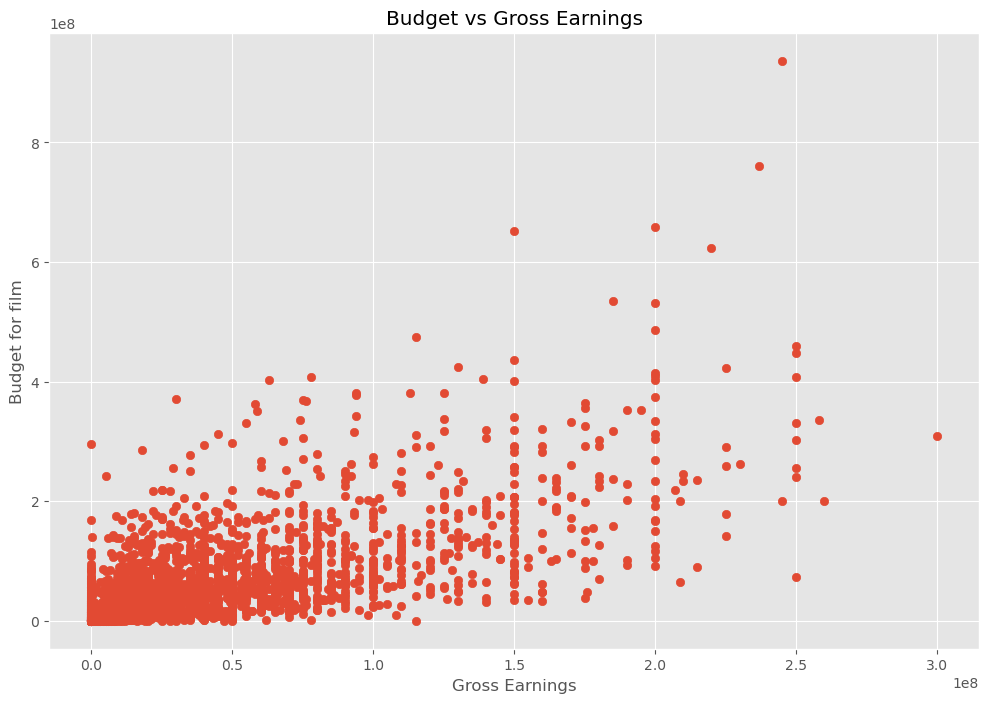

In [20]:
# Scatter plot with budget vs gross earnings

plt.scatter(x= df['budget'], y = df['gross'])

plt.title('Budget vs Gross Earnings')

plt.xlabel('Gross Earnings')

plt.ylabel('Budget for film')

plt.show()

In [21]:
df.head()

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,writer,year,yearcorrect
0,8000000,Columbia Pictures Corporation,USA,Rob Reiner,Adventure,52287414,Stand by Me,R,22-08-1986,89,8.1,Wil Wheaton,Stephen King,1986,1986
1,15000000,Paramount Pictures,USA,Tony Scott,Action,179800601,Top Gun,PG,16-05-1986,110,6.9,Tom Cruise,Jim Cash,1986,1986
2,18500000,Twentieth Century Fox Film Corporation,USA,James Cameron,Action,85160248,Aliens,R,18-07-1986,137,8.4,Sigourney Weaver,James Cameron,1986,1986
3,6000000,Paramount Pictures,USA,John Hughes,Comedy,70136369,Ferris Bueller's Day Off,PG-13,11-06-1986,103,7.8,Matthew Broderick,John Hughes,1986,1986
4,9000000,Paramount Pictures,USA,Howard Deutch,Comedy,40471663,Pretty in Pink,PG-13,28-02-1986,96,6.8,Molly Ringwald,John Hughes,1986,1986


<Axes: xlabel='budget', ylabel='gross'>

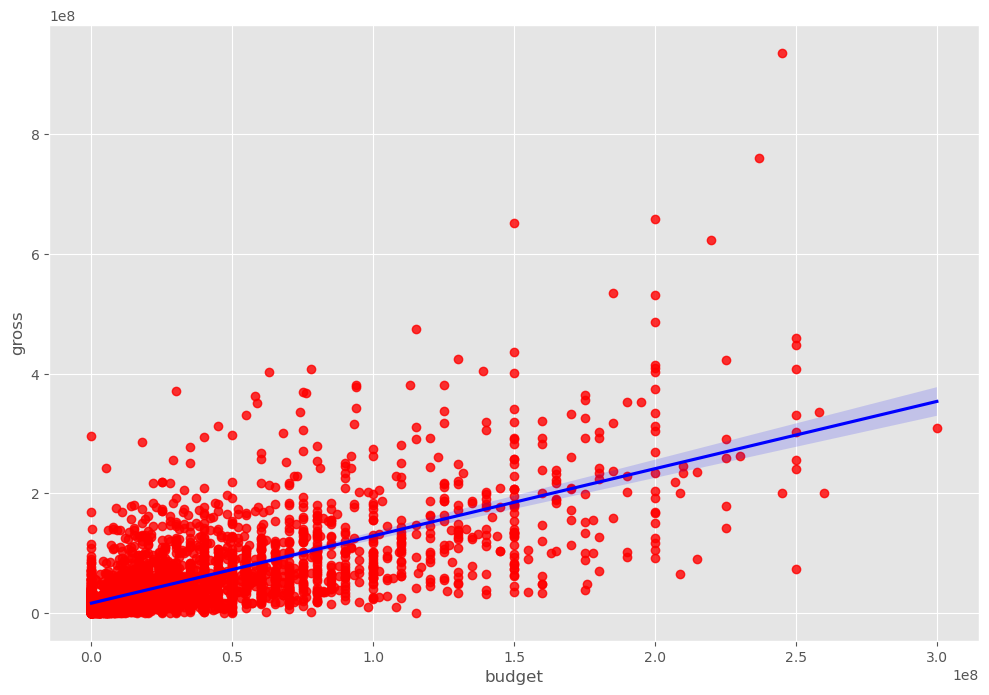

In [24]:
# Plot the budget vs gross collection using seaborn

sns.regplot(x = 'budget', y = 'gross', data = df, scatter_kws = {"color": "red"}, line_kws= {"color": "blue"})

In [39]:
df[['budget', 'gross', 'runtime', 'score', 'year']].corr()

,budget,gross,runtime,score,year
budget,1.000000,0.682588,0.309652,0.019061,0.374904
gross,0.682588,1.000000,0.238183,0.171825,0.246975
runtime,0.309652,0.238183,1.000000,0.386864,0.127864
score,0.019061,0.171825,0.386864,1.000000,0.109251
year,0.374904,0.246975,0.127864,0.109251,1.000000


In [33]:
# High correlation between budget and gross

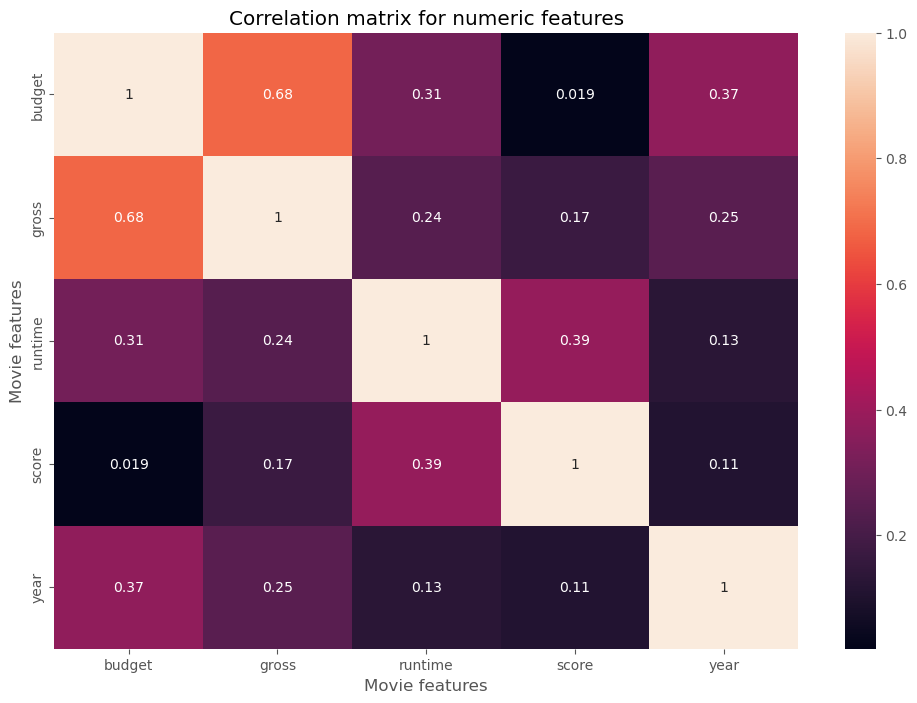

In [44]:
correlation_matrix = df[['budget', 'gross', 'runtime', 'score', 'year']].corr()

sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation matrix for numeric features')

plt.xlabel('Movie features')

plt.ylabel('Movie features')

plt.show()

In [65]:
# Looks at company

df_numerized = df

for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name] = df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes
        
df_numerized
        

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,writer,year,yearcorrect
0,8000000,257,37,1018,1,52287414,2133,6,1212,89,8.1,1150,1722,1986,2
1,15000000,668,37,1244,0,179800601,2861,4,841,110,6.9,1098,874,1986,2
2,18500000,837,37,478,0,85160248,133,6,966,137,8.4,1039,768,1986,2
3,6000000,668,37,597,4,70136369,827,5,559,103,7.8,767,928,1986,2
4,9000000,668,37,449,4,40471663,1777,5,1543,96,6.8,824,928,1986,2
5,6000000,467,36,895,6,138530565,1750,6,259,120,8.1,185,1384,1986,3
6,6000000,298,37,256,6,8551228,343,6,1283,120,7.8,459,409,1986,2
7,10000000,298,37,1141,0,7433663,1464,6,1381,98,5.4,347,1722,1986,2
8,25000000,468,36,547,1,12729917,1314,4,1510,101,7.4,270,453,1986,2
9,8800000,728,1,940,1,174635000,550,5,1472,97,6.5,883,1058,1986,2


In [66]:
df

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,writer,year,yearcorrect
0,8000000,257,37,1018,1,52287414,2133,6,1212,89,8.1,1150,1722,1986,2
1,15000000,668,37,1244,0,179800601,2861,4,841,110,6.9,1098,874,1986,2
2,18500000,837,37,478,0,85160248,133,6,966,137,8.4,1039,768,1986,2
3,6000000,668,37,597,4,70136369,827,5,559,103,7.8,767,928,1986,2
4,9000000,668,37,449,4,40471663,1777,5,1543,96,6.8,824,928,1986,2
5,6000000,467,36,895,6,138530565,1750,6,259,120,8.1,185,1384,1986,3
6,6000000,298,37,256,6,8551228,343,6,1283,120,7.8,459,409,1986,2
7,10000000,298,37,1141,0,7433663,1464,6,1381,98,5.4,347,1722,1986,2
8,25000000,468,36,547,1,12729917,1314,4,1510,101,7.4,270,453,1986,2
9,8800000,728,1,940,1,174635000,550,5,1472,97,6.5,883,1058,1986,2


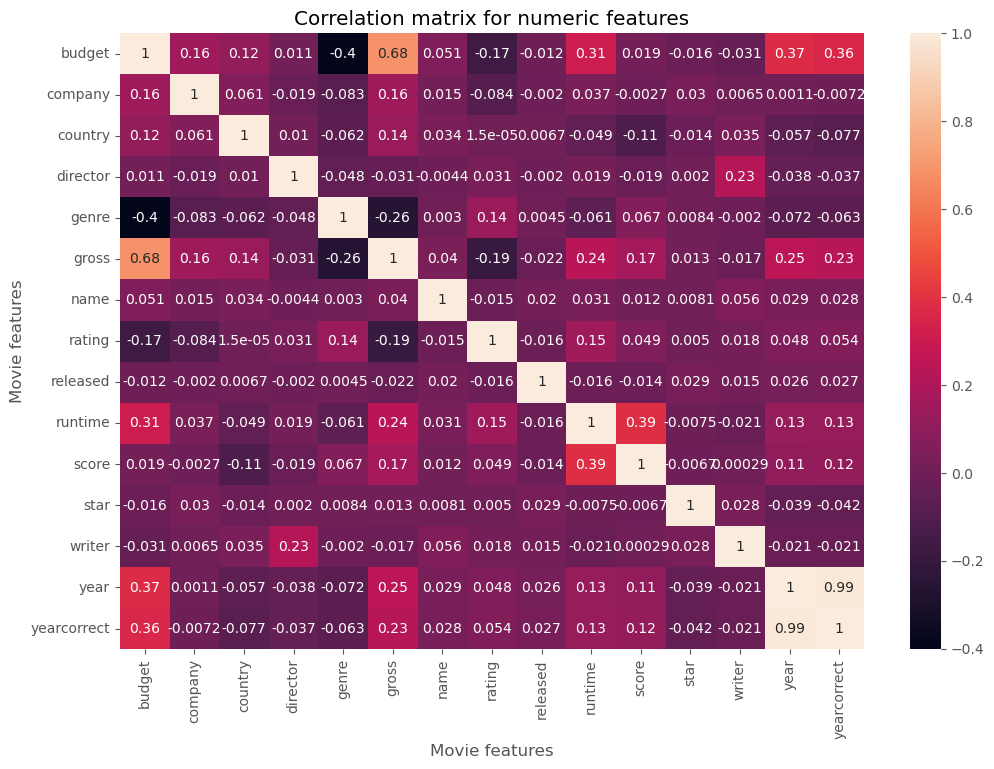

In [67]:
#Developing a heatmap for the numerized correlation matrix

correlation_matrix = df_numerized.corr()

sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation matrix for numeric features')

plt.xlabel('Movie features')

plt.ylabel('Movie features')

plt.show()

In [68]:
#Correation matrix of the entire dataset

df_numerized.corr()

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,writer,year,yearcorrect
budget,1.000000,0.157083,0.118863,0.011052,-0.401052,0.682588,0.051049,-0.171070,-0.012195,0.309652,0.019061,-0.016357,-0.031269,0.374904,0.357906
company,0.157083,1.000000,0.061089,-0.018730,-0.083068,0.156013,0.014947,-0.083646,-0.002015,0.037491,-0.002730,0.030054,0.006527,0.001121,-0.007162
country,0.118863,0.061089,1.000000,0.010291,-0.062478,0.138064,0.034133,0.000015,0.006652,-0.049398,-0.113568,-0.014146,0.035367,-0.057044,-0.077120
director,0.011052,-0.018730,0.010291,1.000000,-0.048337,-0.031221,-0.004434,0.030589,-0.002037,0.018846,-0.018591,0.001973,0.227905,-0.037946,-0.036772
genre,-0.401052,-0.083068,-0.062478,-0.048337,1.000000,-0.263051,0.002989,0.136055,0.004501,-0.061327,0.067234,0.008380,-0.001986,-0.072299,-0.062951
gross,0.682588,0.156013,0.138064,-0.031221,-0.263051,1.000000,0.039578,-0.191666,-0.021879,0.238183,0.171825,0.013428,-0.017184,0.246975,0.231577
name,0.051049,0.014947,0.034133,-0.004434,0.002989,0.039578,1.000000,-0.014934,0.020033,0.031283,0.011649,0.008144,0.055729,0.028571,0.027916
rating,-0.171070,-0.083646,0.000015,0.030589,0.136055,-0.191666,-0.014934,1.000000,-0.015758,0.153396,0.048781,0.004985,0.017506,0.048356,0.054358
released,-0.012195,-0.002015,0.006652,-0.002037,0.004501,-0.021879,0.020033,-0.015758,1.000000,-0.015753,-0.014246,0.028721,0.014980,0.025509,0.026836
runtime,0.309652,0.037491,-0.049398,0.018846,-0.061327,0.238183,0.031283,0.153396,-0.015753,1.000000,0.386864,-0.007494,-0.020986,0.127864,0.127333


In [69]:
#Unstacking the correlation matrix

correlation_mat = df_numerized.corr()

corr_pairs = correlation_mat.unstack()

corr_pairs

budget       budget         1.000000
             company        0.157083
             country        0.118863
             director       0.011052
             genre         -0.401052
             gross          0.682588
             name           0.051049
             rating        -0.171070
             released      -0.012195
             runtime        0.309652
             score          0.019061
             star          -0.016357
             writer        -0.031269
             year           0.374904
             yearcorrect    0.357906
company      budget         0.157083
             company        1.000000
             country        0.061089
             director      -0.018730
             genre         -0.083068
             gross          0.156013
             name           0.014947
             rating        -0.083646
             released      -0.002015
             runtime        0.037491
             score         -0.002730
             star           0.030054
 

In [70]:
sorted_pairs = corr_pairs.sort_values()

sorted_pairs

genre        budget        -0.401052
budget       genre         -0.401052
gross        genre         -0.263051
genre        gross         -0.263051
rating       gross         -0.191666
gross        rating        -0.191666
budget       rating        -0.171070
rating       budget        -0.171070
score        country       -0.113568
country      score         -0.113568
company      rating        -0.083646
rating       company       -0.083646
genre        company       -0.083068
company      genre         -0.083068
yearcorrect  country       -0.077120
country      yearcorrect   -0.077120
genre        year          -0.072299
year         genre         -0.072299
yearcorrect  genre         -0.062951
genre        yearcorrect   -0.062951
             country       -0.062478
country      genre         -0.062478
runtime      genre         -0.061327
genre        runtime       -0.061327
country      year          -0.057044
year         country       -0.057044
country      runtime       -0.049398
r

In [73]:
# Filtering out the highly correlated pairs.

high_corr = sorted_pairs[(sorted_pairs) > 0.4]

high_corr

gross        budget         0.682588
budget       gross          0.682588
yearcorrect  year           0.988856
year         yearcorrect    0.988856
budget       budget         1.000000
rating       rating         1.000000
writer       writer         1.000000
star         star           1.000000
score        score          1.000000
runtime      runtime        1.000000
released     released       1.000000
name         name           1.000000
gross        gross          1.000000
genre        genre          1.000000
director     director       1.000000
country      country        1.000000
company      company        1.000000
year         year           1.000000
yearcorrect  yearcorrect    1.000000
dtype: float64

In [ ]:
# Budget has the highest correlation to gross earnings
# Company has low correlation to gross earnings